## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [6]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images[1:]:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        #img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)
    else:
        print ('Points not found for img %s ' % fname)

#cv2.destroyAllWindows()

Points not found for img ../camera_cal/calibration4.jpg 
Points not found for img ../camera_cal/calibration5.jpg 


## And so on and so forth...

In [2]:
ret, mtx, dist, rvecs, tvecs \
= cv2.calibrateCamera(objpoints, imgpoints, img.shape[:2], None, None)

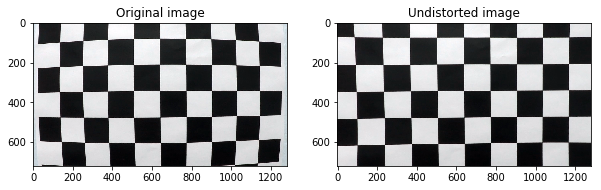

In [3]:
img=cv2.imread(images[0])
dst = cv2.undistort(img, mtx, dist, None, mtx)

fig, ax = plt.subplots(1,2)
fig.set_figheight(10)
fig.set_figwidth(10)

ax[0].imshow(img)
ax[0].set_title('Original image')

ax[1].imshow(dst)
ax[1].set_title('Undistorted image')


plt.show()

In [4]:
def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)

In [7]:
import glob

gl=glob.glob('../test_images/*.jpg')

images=[mpl.image.imread(a) for a in gl]

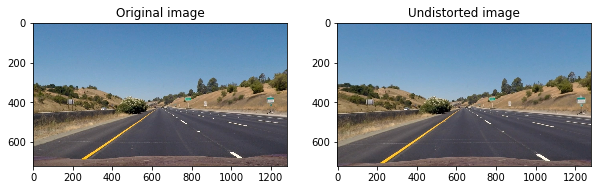

In [8]:
import matplotlib as mpl
img=mpl.image.imread('../test_images/straight_lines1.jpg')
dst = undistort(img)

fig, ax = plt.subplots(1,2)
fig.set_figheight(10)
fig.set_figwidth(10)

ax[0].imshow(img)
ax[0].set_title('Original image')

ax[1].imshow(dst)
ax[1].set_title('Undistorted image')


plt.show()

# с undistort готово, теперь можно разбираться с остальным

In [ ]:
190, 720	340, 720
589, 457	340, 0
698, 457	995, 0
1145,720

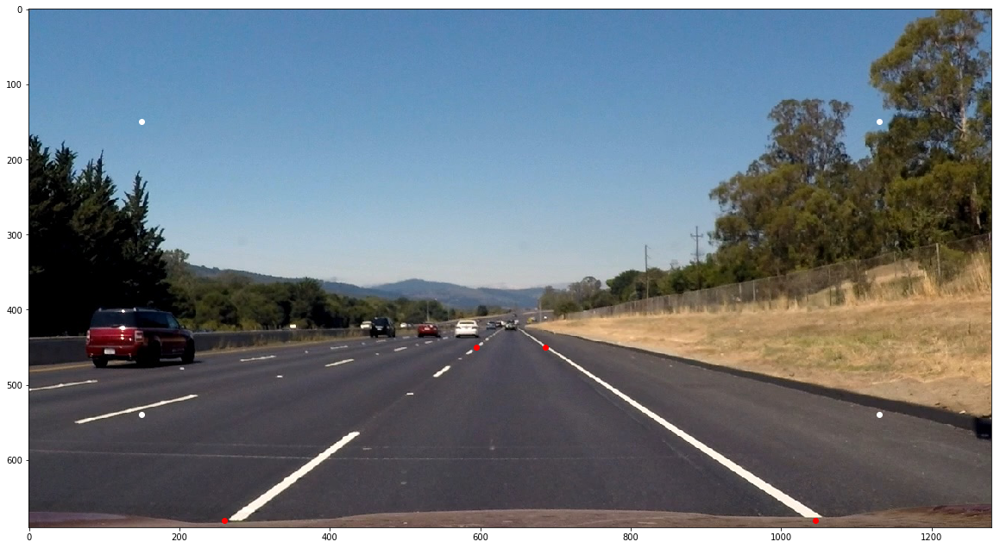

In [87]:
img=mpl.image.imread('../test_images/straight_lines2.jpg')


img=img[:690,:,:]

plt.figure(figsize=(20,20))
plt.imshow(img)

offset=150

#src=np.float32([[525,500],[img.shape[1]-515,500],[img.shape[1]-235,680],[260,680]])

src=np.float32([[595,450],[687,450],[img.shape[1]-235,680],[260,680]])

dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
     [img.shape[1]-offset,img.shape[0]-offset],[offset,img.shape[0]-offset]])

plt.plot([a[0] for a in src],[a[1] for a in src],'ro',color='red')
plt.plot([a[0] for a in dst],[a[1] for a in dst],'ro',color='white')


#plt.plot([260,img.shape[1]-235],[680,680],'ro')
#plt.plot([525,img.shape[1]-515],[500,500],'ro')
plt.show()

In [263]:
#src=np.float32([[525,500],[img.shape[1]-515,500],[img.shape[1]-235,680],[260,680]])
src=np.float32([[595,450],[687,450],[img.shape[1]-235,680],[260,680]])

offset=250

dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
     [img.shape[1]-offset,img.shape[0]],[offset,img.shape[0]]])
#dst=np.float32([[offset,offset],[img.shape[1]-offset,offset],\
#     [img.shape[1]-offset,img.shape[0]-offset],[offset,img.shape[0]-offset]])

M=cv2.getPerspectiveTransform(src,dst)
Minv=cv2.getPerspectiveTransform(dst,src)


def pr(img):
    return cv2.warpPerspective(img[:690],M, (img.shape[1],690), flags=cv2.INTER_LINEAR)

def pr_r(img):
    return cv2.warpPerspective(img,Minv, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)



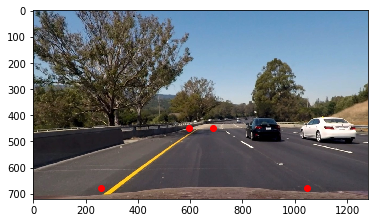

In [264]:
plt.imshow(img)
plt.plot([a[0] for a in src],[a[1] for a in src],'ro',color='red')


plt.show()

(720, 1280, 3) (690, 1280, 3)


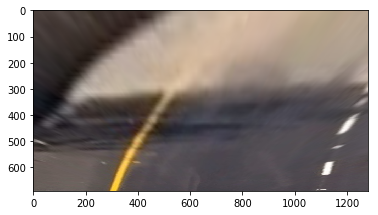

In [265]:
M=cv2.getPerspectiveTransform(src,dst)
M_reverse=cv2.getPerspectiveTransform(dst,src)

warped=pr(img)
print (img.shape, warped.shape)

plt.imshow(warped)
plt.show()

# готовы функции pr и pr_r - проекция и reverse проекции

In [266]:
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

trapece=np.array( [[image.shape[1]*0.05, image.shape[0]],\
                        [image.shape[1]*0.95, image.shape[0]],\
                        [image.shape[1]*0.64,image.shape[0]*0.6],\
                       [image.shape[1]*0.36, image.shape[0]*0.6]], np.int32)

    #this is part of our region - we will cut it a little bit after using canny - to crop region
trapece2=trapece+np.array([[1,0],[-1,0],[1,1],[-1,1]])*3

def region_of_interest(img, vertices=trapece):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image



In [267]:
def get_channel(img,channel):
    # take needed channel
    if channel=='gray':
        channel = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    if channel in ('l','s'):
        hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        channel = hls[:,:,1] if channel=='l' else hls[:,:,2]
    return channel

def abs_sobel_thresh(img, orient='x', channel='gray',thresh=(0,255)):
    # take needed channel
    gray=get_channel(img,channel)
        
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

def mag_thresh(img, sobel_kernel=3, thresh=(0, 255),channel='gray'):
    
    # Convert to grayscale
    gray=get_channel(img,channel)
    
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh[0]) & (gradmag <= thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2),channel='gray'):
    # Grayscale
    gray=get_channel(img,channel)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def channel_select(img, thresh=(0, 255), channel='gray'):
    gray=get_channel(img,channel)
    binary_output = np.zeros_like(gray)
    binary_output[(gray > thresh[0]) & (gray <= thresh[1])] = 1
    return binary_output

def mean_channel_select(img, thresh=(0, 1), channel='gray'):
    gray=get_channel(img,channel)
    #scale to mean value
    a,b,c=np.polyfit([0,gray.mean(),255],[0,1/2,1], 2)
    scaled=gray*a**2+gray*b+gray*c
    binary_output = np.zeros_like(gray)
    binary_output[(scaled > thresh[0]) & (scaled <= thresh[1])] = 1
    return binary_output



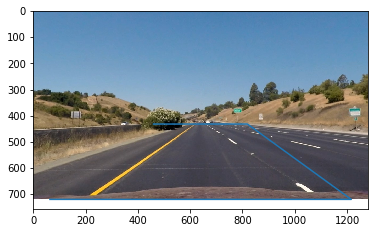

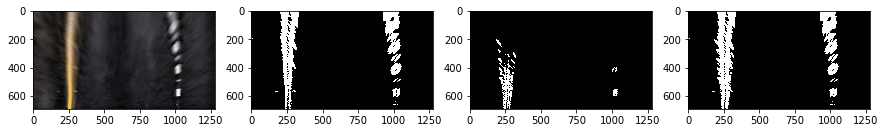

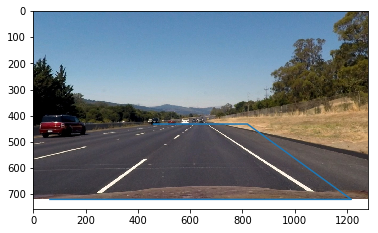

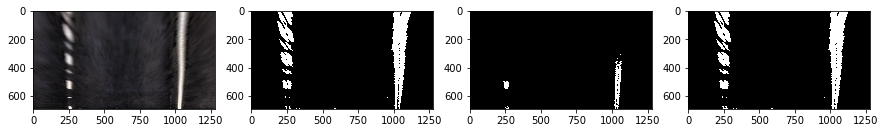

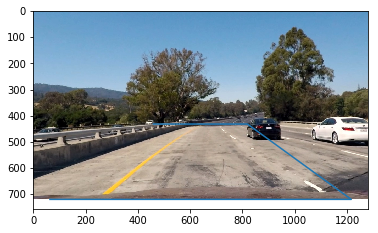

...

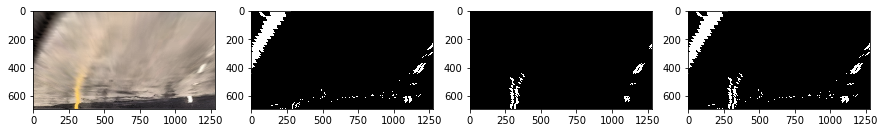

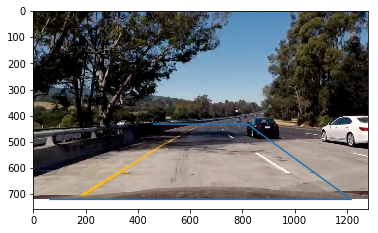

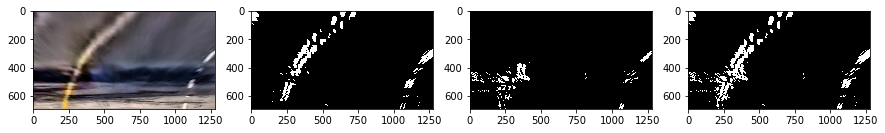

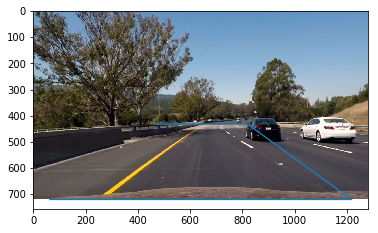

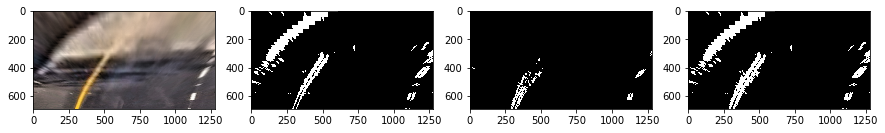

In [268]:
for img in images:
    img=undistort(img)
    plt.imshow(img)
    plt.plot([a[0] for a in trapece],[a[1] for a in trapece])
    
    fig,ax=plt.subplots(1,4)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    ax[0].imshow( equalize_adapthist(pr(img)))
    l_sobel = abs_sobel_thresh(img, channel='l',  thresh=(15,255))
    ax[1].imshow(pr(l_sobel), cmap='gray')
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
    ax[2].imshow(pr(s_sobel), cmap='gray')
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
    ax[3].imshow(pr(s_sobel | l_sobel), cmap='gray')
    
    plt.show()

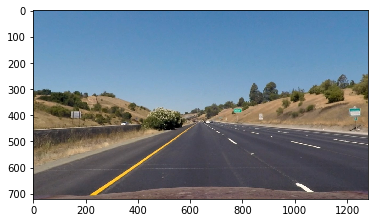

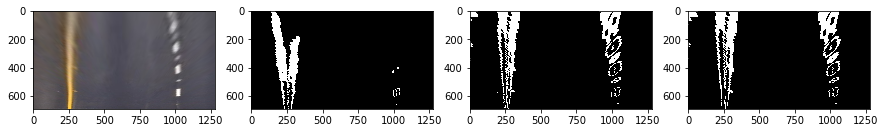

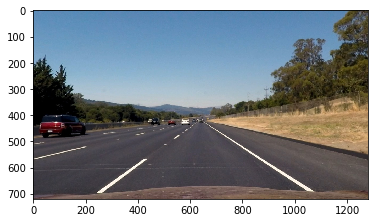

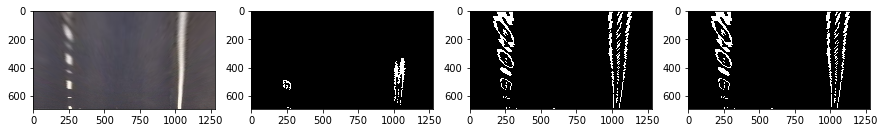

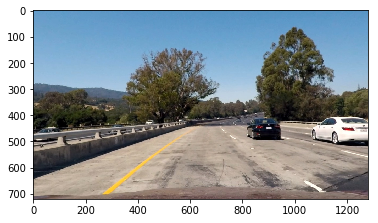

...

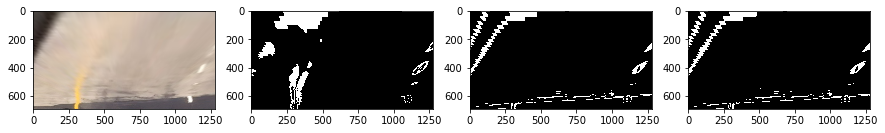

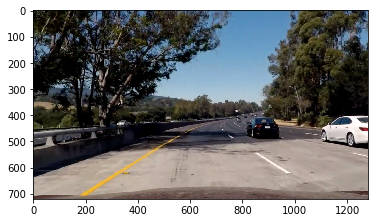

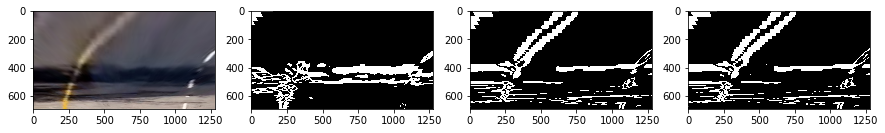

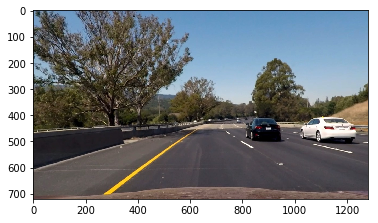

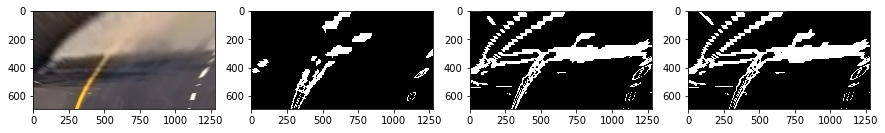

In [270]:
for img in images:
    img=undistort(img)
    plt.imshow(img)
    
    fig,ax=plt.subplots(1,4)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    angle=0.4
    
    
    ax[0].imshow(pr(img))
    l_sobel = mag_thresh(img, sobel_kernel=9, thresh=(30, 90), channel='s')
    ax[1].imshow(pr(l_sobel), cmap='gray')
    s_sobel = mag_thresh(img, sobel_kernel=9, thresh=(30, 90), channel='l')
    ax[2].imshow(pr(s_sobel), cmap='gray')
    s_sobel = mag_thresh(img, sobel_kernel=9, thresh=(30, 90), channel='gray')
    ax[3].imshow(pr(s_sobel), cmap='gray')
    
    plt.show()

In [272]:
def binarize_old(img):
    "final gradient function"
    grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=20, thresh_max=100)
    mag_binary = mag_thresh(img, sobel_kernel=9, thresh=(30, 90))
    hls_binary = hls_select(img, thresh=(90, 255))
    angle=0.5

    dir_binary = dir_threshold(img, sobel_kernel=29, thresh=(angle,np.pi/2-angle))



    return (grad_binary | mag_binary | hls_binary)*dir_binary

def binarize(img):
    "final gradient function"
    l_sobel = abs_sobel_thresh(img, channel='l',  thresh=(15,255))
    s_sobel = abs_sobel_thresh(img, channel='s',  thresh=(25,255))
    


    return s_sobel | l_sobel

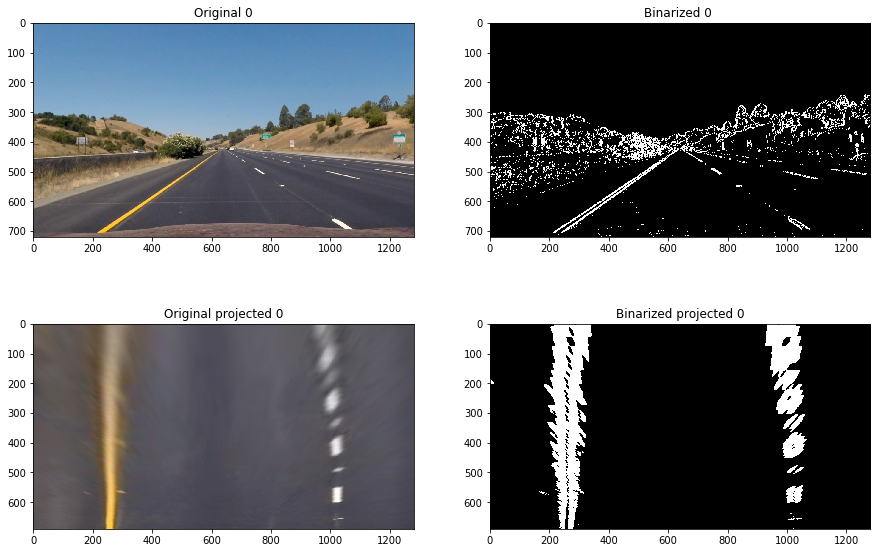

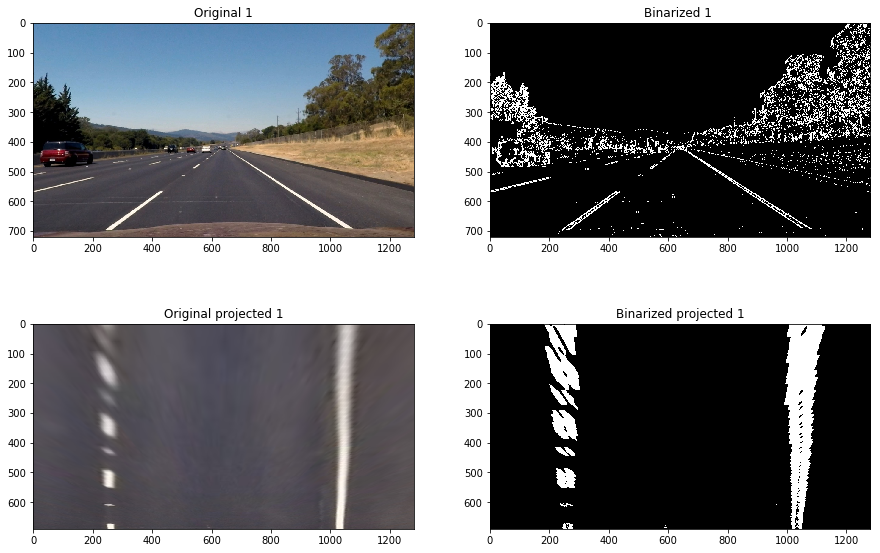

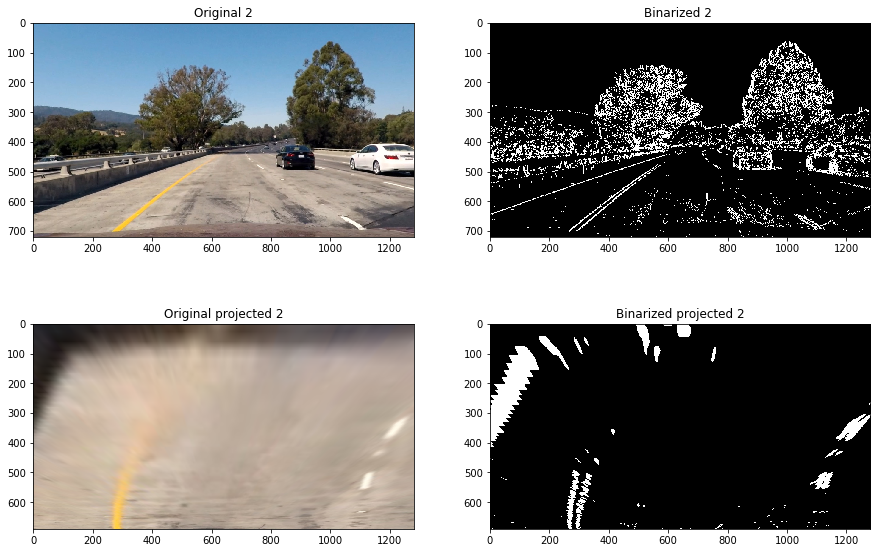

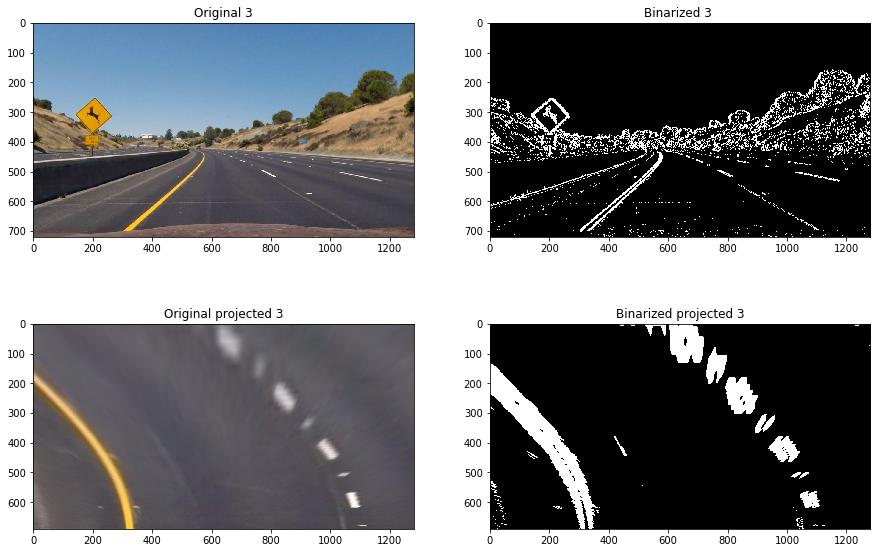

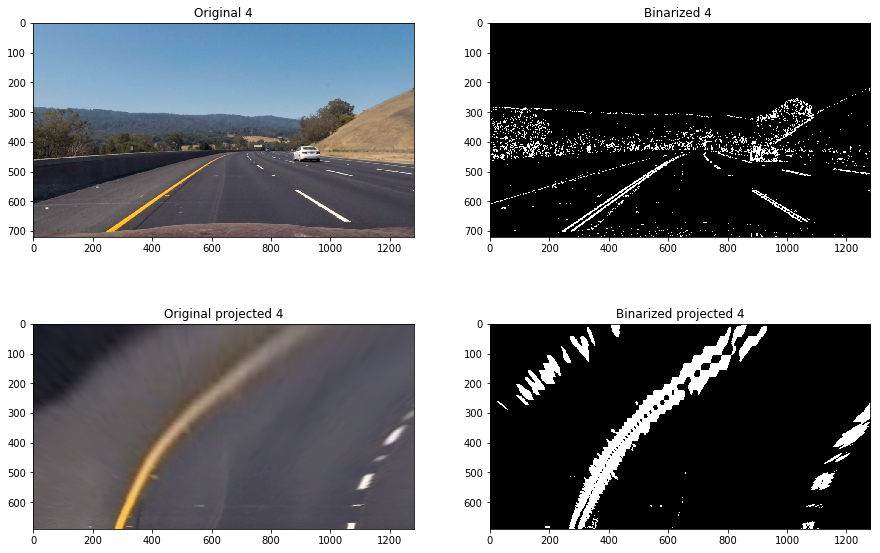

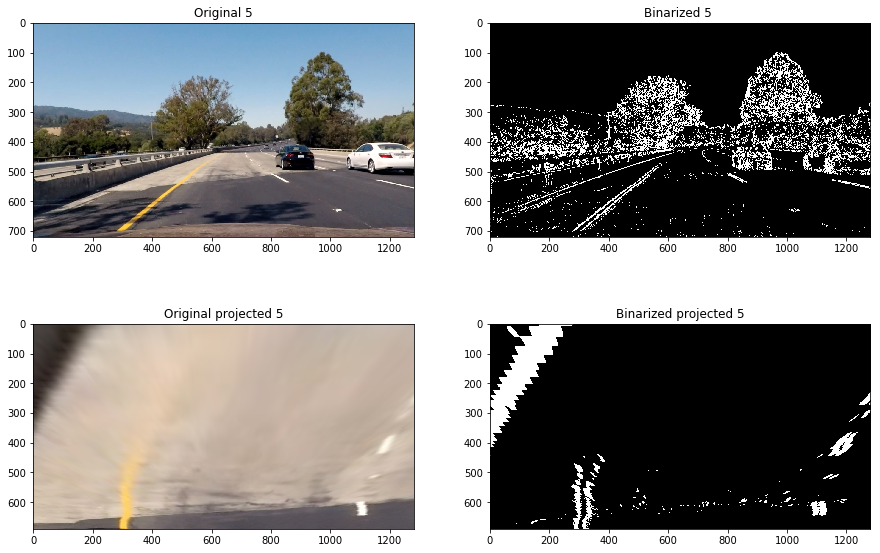

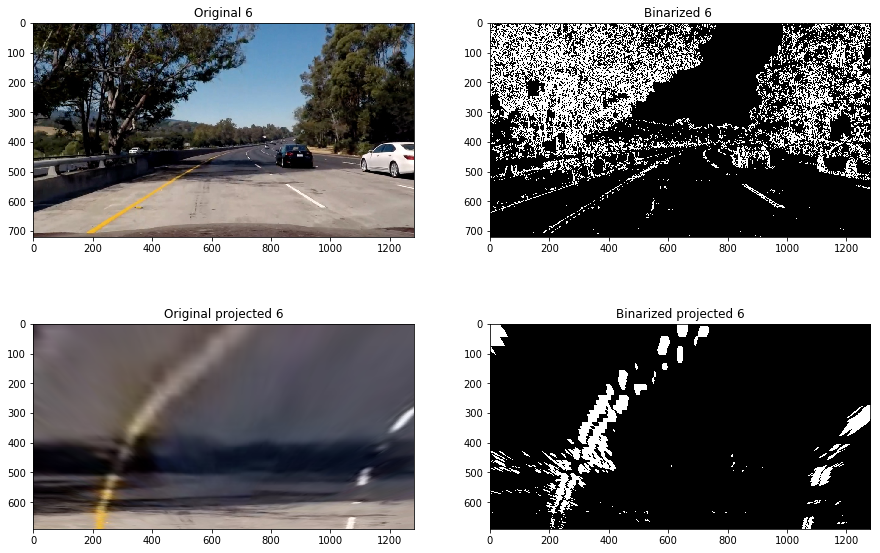

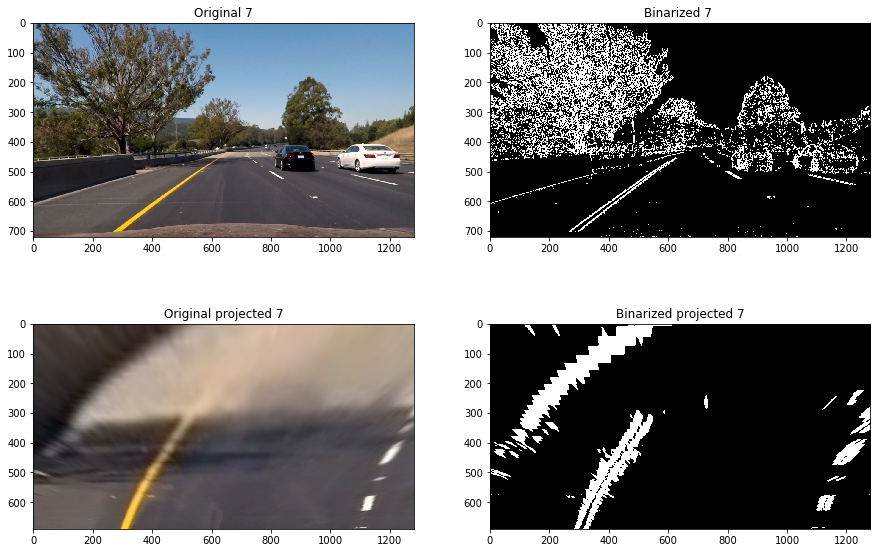

In [274]:
#fig, ax = plt.subplots(len(images)*2,2)

#fig.set_figheight(10*len(images))
#fig.set_figwidth(15)

for j,img in  enumerate(images):
    fig, ax = plt.subplots(2,2)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    i=0
    img=undistort(img)
    
    binimage=binarize(img)
    ax[2*i][0].imshow(img)
    ax[2*i][1].imshow(binimage, cmap='gray')
    ax[2*i+1][1].imshow(pr(binimage),cmap='gray')
    ax[2*i+1][0].imshow(pr(img))
    ax[2*i][0].set_title('Original %d'% j)
    ax[2*i][1].set_title('Binarized %d ' %j )
    ax[2*i+1][0].set_title('Original projected %d' %j)
    ax[2*i+1][1].set_title('Binarized projected %d' %j)
    
    
    plt.show()
    

# теперь будем рисовать линии

import numpy as np
histogram = np.sum(result[result.shape[0]//2:,:], axis=0)
plt.plot(histogram)

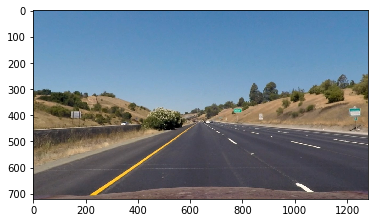

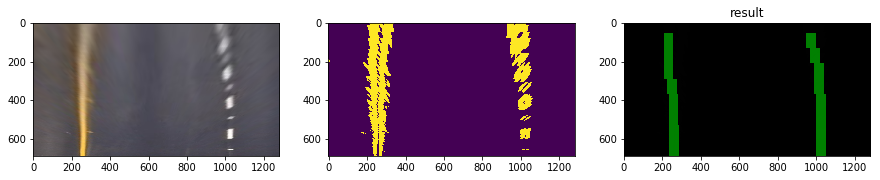

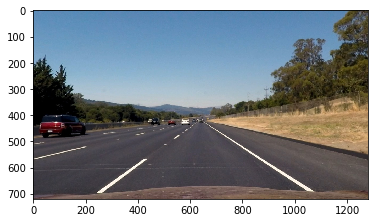

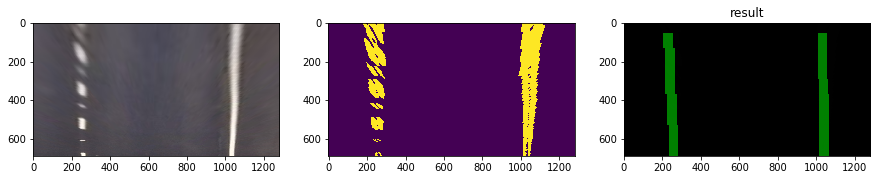

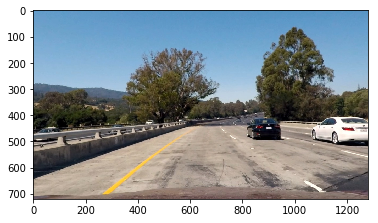

...

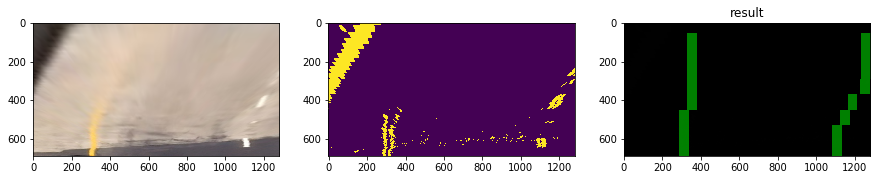

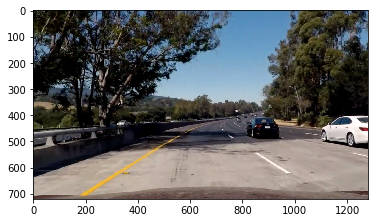

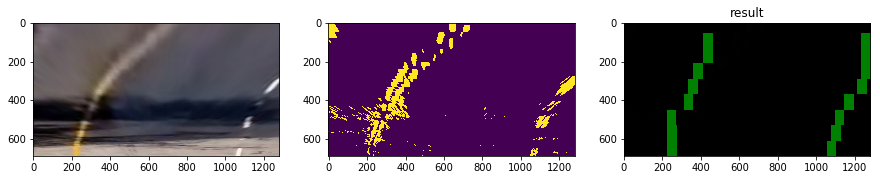

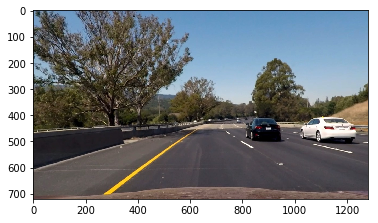

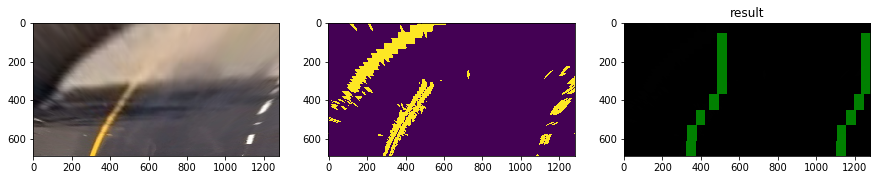

In [321]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import cv2

# Read in a thresholded image
#warped = result
# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin,\
                          margin_left=None,margin_right=None, max_tresh=0 ):
    """
    Added left and right margins
    """
    
    if not margin_left:
        margin_left, margin_right = margin,margin
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
        conv_signal = np.convolve(window, image_layer)
        #plt.plot (conv_signal)
        #plt.show()
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        
        if l_center>margin:
            l_min_index = int(max(l_center+offset-margin_left,0))
            l_max_index = int(min(l_center+offset+margin_right,warped.shape[1]))
            l_m=conv_signal[l_min_index:l_max_index].max()
            if l_m>max_tresh:
                l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        else:
            l_center=-margin

        # Find the best right centroid by using past right center as a reference
        if r_center>margin:
            r_min_index = int(max(r_center+offset-margin_left,0))
            r_max_index = int(min(r_center+offset+margin_right,warped.shape[1]))
            r_m=conv_signal[r_min_index:r_max_index].max()
            #print (r_m)
            if r_m>max_tresh:
                r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
            
            
        else:
            r_center=warped.shape[1]+margin
        
        
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    return window_centroids

def draw_window_centroids(window_centroids):
    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

        # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    return output

for img in images:
    img=undistort(img)
    plt.imshow(img)
    plt.show()
    img=img[:600,:,:]
    warped=pr(binarize(img))
    
    window_centroids=find_window_centroids(img, window_width, window_height, margin)
    
    m=(np.array(window_centroids)[1:]-np.array(window_centroids)[:-1]).mean()
    
    if m>0:
        window_centroids=find_window_centroids(img, window_width, window_height, margin,\
                                           margin_left=1,margin_right=100)
    else:
        window_centroids=find_window_centroids(img, window_width, window_height, margin,\
                                           margin_left=100,margin_right=1, max_tresh=1000)
    
    output=draw_window_centroids(window_centroids)
    # Display the final results
    
    fig,ax=plt.subplots(1,3)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    ax[0].imshow(pr(img))
    ax[1].imshow(warped)
    ax[2].imshow(output)
    ax[2].set_title('result')
    plt.show()




In [299]:
(np.array(window_centroids)[1:]-np.array(window_centroids)[:-1]).mean()

28.285714285714285

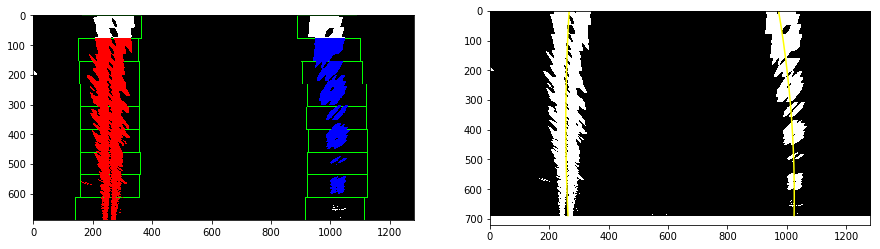

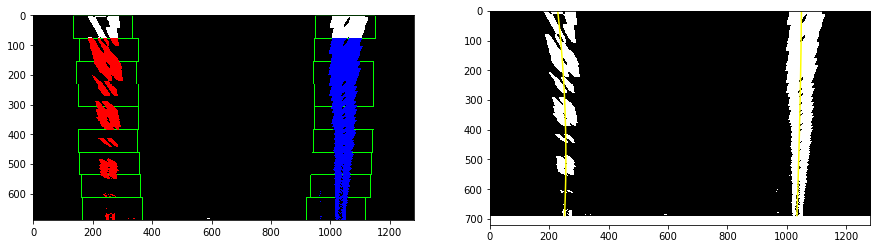

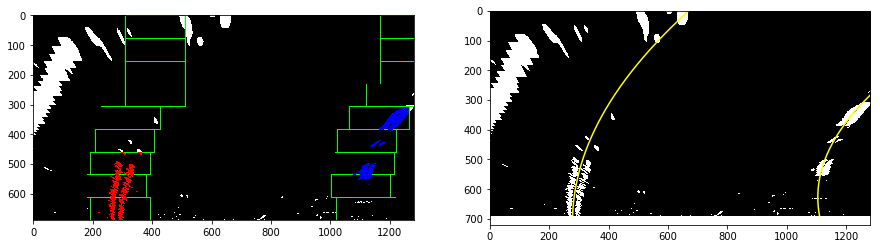

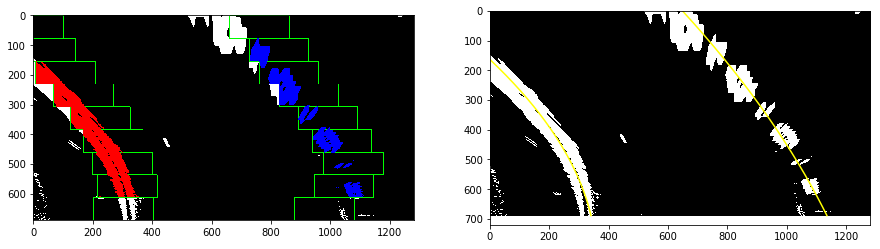

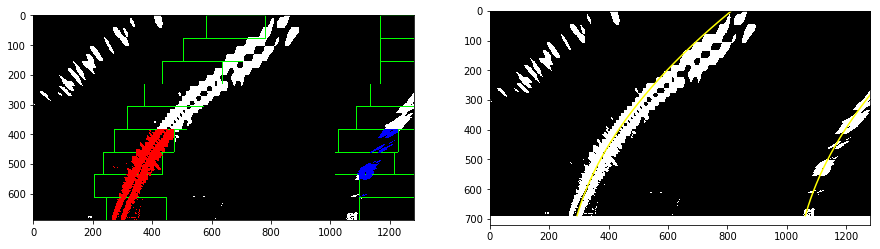

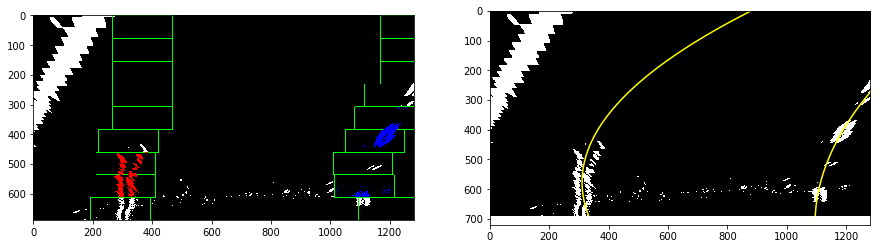

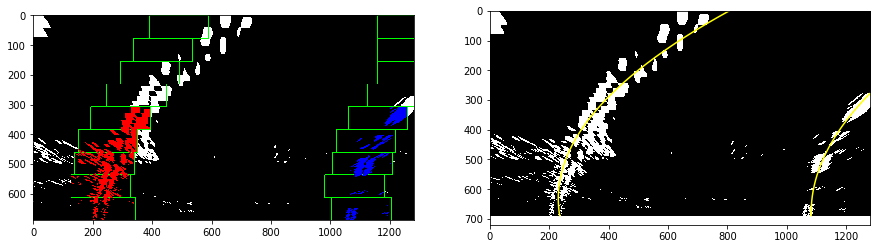

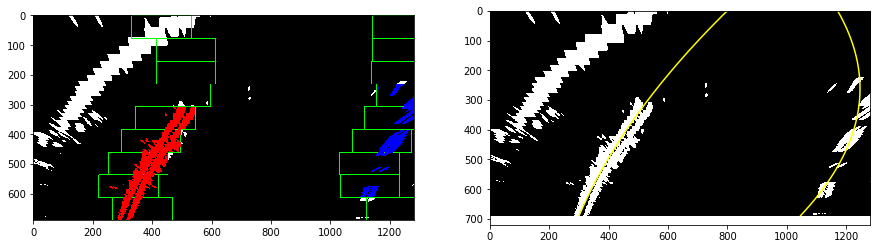

In [403]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

for img in images:

    binary_warped = pr(binarize(img))

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    #left and right centers
    left_centers=[]
    right_centers=[]

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image

        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            left_centers.append(leftx_current)
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
            right_centers.append(rightx_current)

    #get lines direction
    left_dir=np.array(right_centers)[:-1]-np.array(right_centers)[1:]
    right_dir=np.array(right_centers)[:-1]-np.array(right_centers)[1:]
    direction = np.concatenate([left_dir, right_dir]).mean()

    if direction<-20:
        good_left=np.where(left_dir<0)[0]
        good_right=np.where(right_dir<0)[0]
    elif direction>20:
        good_left=np.where(left_dir>0)[0]
        good_right=np.where(right_dir>0)[0]
    else:
        good_left=range(len(left_dir))
        good_right=range(len(right_dir))
        
    t=500
    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate([left_lane_inds[a] for a in good_left\
                                   if len(left_lane_inds[a])>t])
    right_lane_inds = np.concatenate([right_lane_inds[a]  for a in good_right\
                                    if len(right_lane_inds[a])>t])
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    fig,ax=plt.subplots(1,2)
    fig.set_figheight(10)
    fig.set_figwidth(15)

    ax[0].imshow(out_img)

    ax[1].imshow(binary_warped,cmap='gray')
    ax[1].plot(left_fitx, ploty, color='yellow')
    ax[1].plot(right_fitx, ploty, color='yellow')
    ax[1].set_xlim(0, 1280)
    ax[1].set_ylim(720, 0)
    plt.show()

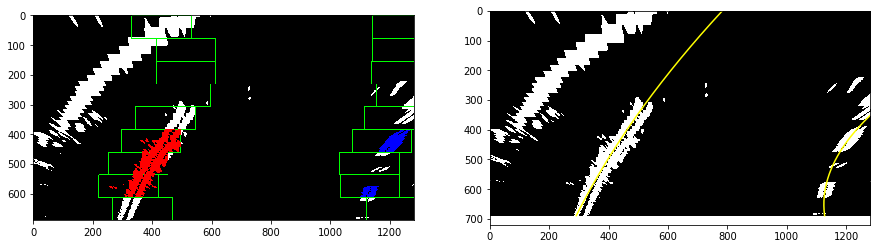

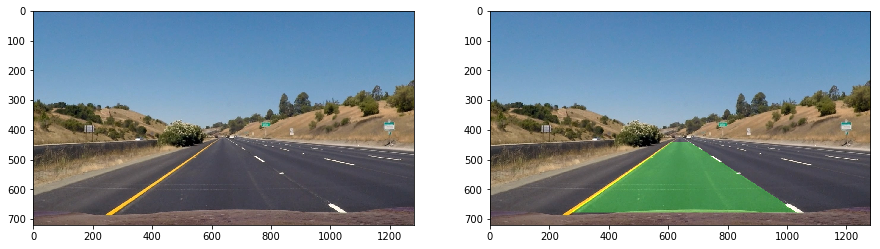

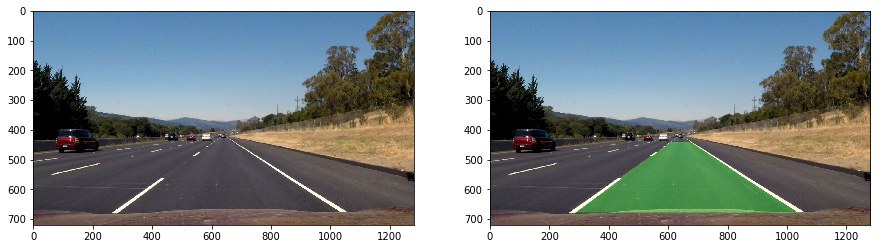

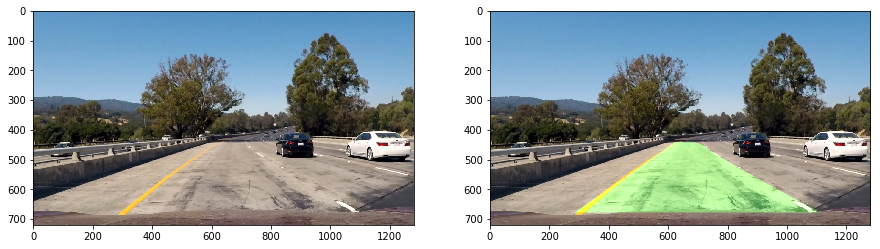

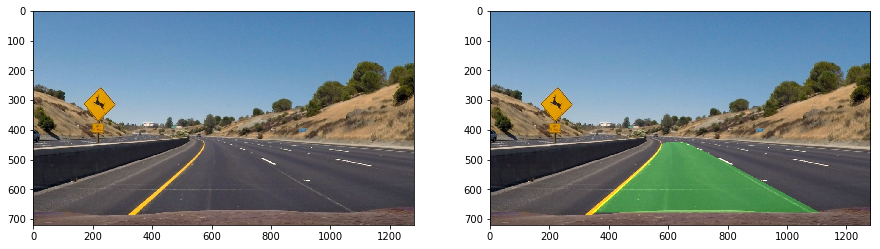

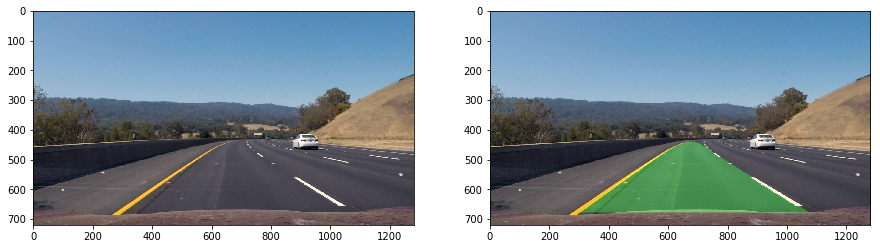

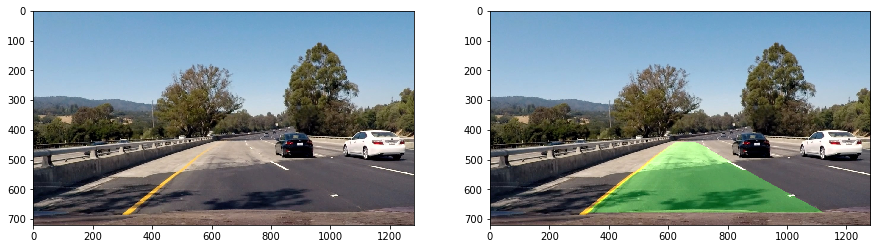

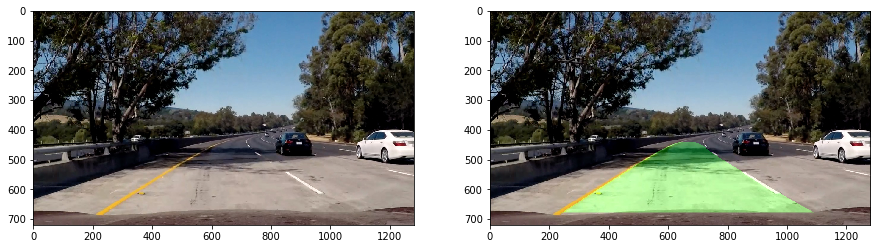

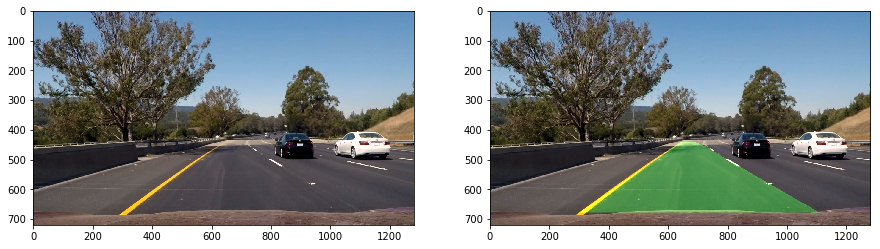

In [114]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

for img in images:
    
    binary_warped = pr(binarize(img))

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    fig,ax=plt.subplots(1,2)
    fig.set_figheight(10)
    fig.set_figwidth(15)
    
    ax[0].imshow(img)
    
    image=img
#undist=

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    ax[1].imshow(result)
    plt.show()

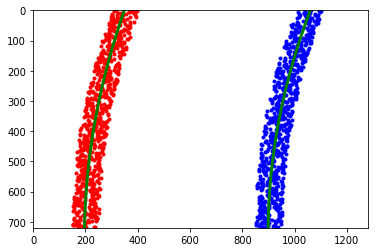

In [73]:
import numpy as np
import matplotlib.pyplot as plt
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient

# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

In [70]:
binary_warped[int(binary_warped.shape[0]/2):,:]

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [65]:
binary_warped.shape[0]/2

360.0

In [115]:
def process_image(img):
    
    binary_warped = pr(binarize(img))

    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    image=img
#undist=

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return result

In [116]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

clip1 = VideoFileClip('../project_video.mp4')
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile('test.mp4', audio=False)



[MoviePy] >>>> Building video test.mp4
[MoviePy] Writing video test.mp4


100%|█████████▉| 1260/1261 [06:49<00:00,  3.51it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test.mp4 

CPU times: user 5min 46s, sys: 1min 37s, total: 7min 23s
Wall time: 6min 50s


In [124]:
from skimage.exposure import equalize_adapthist

tmp=equalize_adapthist(images[6])



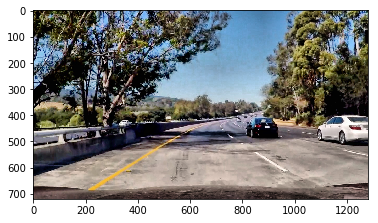

In [126]:
plt.imshow(tmp)

In [123]:
help(equalize_adapthist)

Help on function equalize_adapthist in module skimage.exposure._adapthist:

equalize_adapthist(image, kernel_size=None, clip_limit=0.01, nbins=256, **kwargs)
    Contrast Limited Adaptive Histogram Equalization (CLAHE).
    
    An algorithm for local contrast enhancement, that uses histograms computed
    over different tile regions of the image. Local details can therefore be
    enhanced even in regions that are darker or lighter than most of the image.
    
    Parameters
    ----------
    image : (M, N[, C]) ndarray
        Input image.
    kernel_size: integer or list-like, optional
        Defines the shape of contextual regions used in the algorithm. If
        iterable is passed, it must have the same number of elements as
        ``image.ndim`` (without color channel). If integer, it is broadcasted
        to each `image` dimension. By default, ``kernel_size`` is 1/8 of
        ``image`` height by 1/8 of its width.
    clip_limit : float, optional
        Clipping limit, nor

In [220]:
img.mean()

101.33842050057871

In [226]:
a,b,c=np.polyfit([0,100,255],[0,1/2,1], 2)

In [228]:
x=255
a*x**2+b*x+c

1.0000000000000002